In [1]:
import pandas as pd
import numpy as np
import datetime
import urllib
import csv
import os

In [2]:
from bokeh.plotting import *
from bokeh.models import HoverTool
from collections import OrderedDict

In [ ]:
df1 = pd.read_json("https://data.lacounty.gov/resource/3te6-gtm8.json?$limit=849112")

In [3]:
os.path.isfile('/Users/SpecialK/Downloads/LOS_ANGELES_COUNTY_RESTAURANTS_AND_MARKETS_VIOLATIONS.csv')

True

In [4]:
df = pd.read_csv('/Users/SpecialK/Downloads/LOS_ANGELES_COUNTY_RESTAURANTS_AND_MARKETS_VIOLATIONS.csv')

In [5]:
df.head(5)

,ACTIVITY DATE,RECORD ID,NAME,ADDRESS,SITE ADDRESS,SITE CITY,SITE STATE,SITE ZIP,PROGRAM ELEMENT CODE,PROGRAM ELEMENT CODE DESCRIPTION,SERVICE DESCRIPTION,ROW ID,VIOLATION CODE,VIOLATION CODE DESCRIPTION,POINTS,SCORE,GRADE,COUNT
0,06/17/2015,PR0166398,FRESH BROTHERS PIZZA,"200 WORLD WAY # T235 LOS ANGELES, CA 90045",200 WORLD WAY # T235,LOS ANGELES,CA,90045,1635,RESTAURANT (31-60) SEATS HIGH RISK,ROUTINE INSPECTION,IVBZSG0WC,16F040,"# 40. Plumbing: Plumbing in good repair, prope...",1,93,A,1
1,06/18/2015,PR0034652,DARK HORSE TAVERN,"5507 RESEDA BLVD TARZANA, CA 91356",5507 RESEDA BLVD,TARZANA,CA,91356,1638,RESTAURANT (61-150) SEATS HIGH RISK,ROUTINE INSPECTION,IVU1XQ7ME,16F034,"# 34. Warewashing facilities: Adequate, mainta...",1,90,A,1
2,06/18/2015,PR0042267,OUTDOOR GRILL,"12630 1/2 WASHINGTON PL LOS ANGELES, CA 90066",12630 1/2 WASHINGTON PL,LOS ANGELES,CA,90066,1632,RESTAURANT (0-30) SEATS HIGH RISK,ROUTINE INSPECTION,IVNCSGWZY,16F036,"# 36. Equipment, utensils and linens: storage ...",1,96,A,1
3,06/17/2015,PR0007528,J.F. INTERNATIONAL,"1001 SAN JULIAN ST # A LOS ANGELES, CA 90015",1001 SAN JULIAN ST # A,LOS ANGELES,CA,90015,1610,"FOOD MKT RETAIL (25-1,999 SF) LOW RISK",ROUTINE INSPECTION,IVBRNHZOF,16W050,Food properly labeled,0,100,A,1
4,06/18/2015,PR0129590,DAVE & BUSTERS,"6081 CENTER DR LOS ANGELES, CA 90045",6081 CENTER DR,LOS ANGELES,CA,90045,1641,RESTAURANT (151 + ) SEATS HIGH RISK,ROUTINE INSPECTION,IVDZHADY7,16F007,# 7. Proper hot and cold holding temperatures,4,90,A,1


In [6]:
df.shape

(849112, 18)

In [7]:
df.describe()

,PROGRAM ELEMENT CODE,POINTS,SCORE,COUNT
count,849112.000000,849112.000000,849112.000000,849112.0
mean,1630.806379,1.322877,92.028884,1.0
std,8.834667,0.754567,4.458572,0.0
min,1610.000000,0.000000,-7.000000,1.0
25%,1631.000000,1.000000,90.000000,1.0
50%,1632.000000,1.000000,92.000000,1.0
75%,1635.000000,1.000000,95.000000,1.0
max,1641.000000,11.000000,100.000000,1.0


In [8]:
df.dtypes

ACTIVITY DATE                       object
RECORD ID                           object
NAME                                object
ADDRESS                             object
SITE ADDRESS                        object
SITE CITY                           object
SITE STATE                          object
SITE ZIP                            object
PROGRAM ELEMENT CODE                 int64
PROGRAM ELEMENT CODE DESCRIPTION    object
SERVICE DESCRIPTION                 object
ROW ID                              object
VIOLATION CODE                      object
VIOLATION CODE DESCRIPTION          object
POINTS                               int64
SCORE                                int64
GRADE                               object
COUNT                                int64
dtype: object

In [9]:
#make all columns lowercase
df.columns = map(str.lower, df.columns)

In [10]:
del df['address']

In [11]:
df.rename(columns={'activity date': 'date', 'record id': 'record_id', 'site address': 'address', 'site city': 'city', 'site state': 'state', 'site zip': 'zip', 'program element code': 'element_code', 'program element code description': 'element_code_descr', 'service description': 'service_descr', 'row id': 'row_id', 'violation code': 'violation_code', 'violation code description': 'violation_code_descr'}, inplace=True)

In [12]:
df['date'] = pd.to_datetime(df.date)

In [13]:
#Sort according to date
df.sort_values(by='date')

,date,record_id,name,address,city,state,zip,element_code,element_code_descr,service_descr,row_id,violation_code,violation_code_descr,points,score,grade,count
127421,2014-10-01,PR0019124,OCTOPUS,112 N MARYLAND AVE,GLENDALE,CA,91206,1638,RESTAURANT (61-150) SEATS HIGH RISK,ROUTINE INSPECTION,IVFSDXF0G,16F007,# 7. Proper hot and cold holding temperatures,2,90,A,1
577787,2014-10-01,PR0023506,DAYRO MARKET,4524 W MARINE AVE,LAWNDALE,CA,90260,1612,"FOOD MKT RETAIL (25-1,999 SF) HIGH RISK",ROUTINE INSPECTION,IV58CARRS,16F009,# 9. Proper cooling methods,4,95,A,1
528877,2014-10-01,PR0002665,MEME'S LITTLE TASTE OF TEXAS,5372 WHITTIER BLVD,LOS ANGELES,CA,90022,1632,RESTAURANT (0-30) SEATS HIGH RISK,ROUTINE INSPECTION,IVRMBCEXG,16F001,# 1a. Demonstration of knowledge,2,92,A,1
325802,2014-10-01,PR0009089,PIZZA CONNECTION,1136 WESTWOOD BLVD,LOS ANGELES,CA,90024,1635,RESTAURANT (31-60) SEATS HIGH RISK,ROUTINE INSPECTION,IVRW10OG2,16F033,# 33. Nonfood-contact surfaces clean and in go...,1,90,A,1
411115,2014-10-01,PR0020539,LOS FELIZ CAFE,3207 LOS FELIZ BLVD,LOS ANGELES,CA,90039,1638,RESTAURANT (61-150) SEATS HIGH RISK,ROUTINE INSPECTION,IVZJCSQXB,16F036,"# 36. Equipment, utensils and linens: storage ...",1,91,A,1
477149,2014-10-01,PR0025835,LUCKY CHINA,248 E CARSON ST,CARSON,CA,90745,1638,RESTAURANT (61-150) SEATS HIGH RISK,ROUTINE INSPECTION,IVNKE9PLW,16F023,"# 23. No rodents, insects, birds, or animals",4,80,B,1
578196,2014-10-01,PR0017969,MARIE CALLENDERS REST NO 65,1175 E ALOSTA AVE,AZUSA,CA,91702,1641,RESTAURANT (151 + ) SEATS HIGH RISK,ROUTINE INSPECTION,IVYTC5OIQ,16F007,# 7. Proper hot and cold holding temperatures,2,91,A,1
598633,2014-10-01,PR0151785,DAWA GRILL,13353 ALONDRA BLVD STE 100,SANTA FE SPRINGS,CA,90670-5557,1635,RESTAURANT (31-60) SEATS HIGH RISK,ROUTINE INSPECTION,IVCOO27CN,16F040,"# 40. Plumbing: Plumbing in good repair, prope...",1,90,A,1
491353,2014-10-01,PR0035664,HONG KONG EXPRESS,1125 E ALOSTA AVE,AZUSA,CA,91702,1632,RESTAURANT (0-30) SEATS HIGH RISK,OWNER INITIATED ROUTINE INSPECT.,IVCSXCQPP,16F007,# 7. Proper hot and cold holding temperatures,4,90,A,1
220594,2014-10-01,PR0037608,KOTOYA,11901 SANTA MONICA BLVD STE #111,LOS ANGELES,CA,90025,1632,RESTAURANT (0-30) SEATS HIGH RISK,ROUTINE INSPECTION,IVTXKVFDO,16F036,"# 36. Equipment, utensils and linens: storage ...",1,96,A,1


In [14]:
df.groupby(["grade"])["score"].count()

grade
A     753656
B      88211
C       6646
SC       439
Name: score, dtype: int64

In [15]:
filter = df["grade"] == "C"

In [16]:
df[filter]

,date,record_id,name,address,city,state,zip,element_code,element_code_descr,service_descr,row_id,violation_code,violation_code_descr,points,score,grade,count
16,2015-06-18,PR0147293,SHAM TSENG BBQ SHOP,634 W GARVEY AVE,MONTEREY PARK,CA,91754-2706,1635,RESTAURANT (31-60) SEATS HIGH RISK,ROUTINE INSPECTION,IVD4IQR5P,16F036,"# 36. Equipment, utensils and linens: storage ...",1,70,C,1
25,2015-06-18,PR0002740,CURRY LEAF,16300 CRENSHAW BLVD STE 101,TORRANCE,CA,90504,1635,RESTAURANT (31-60) SEATS HIGH RISK,ROUTINE INSPECTION,IVNBLGI0F,16F027,# 27. Food separated and protected,1,70,C,1
30,2015-06-18,PR0002740,CURRY LEAF,16300 CRENSHAW BLVD STE 101,TORRANCE,CA,90504,1635,RESTAURANT (31-60) SEATS HIGH RISK,ROUTINE INSPECTION,IV5AHPDWK,16F046,# 46. Signs posted; last inspection report ava...,1,70,C,1
42,2015-06-18,PR0147293,SHAM TSENG BBQ SHOP,634 W GARVEY AVE,MONTEREY PARK,CA,91754-2706,1635,RESTAURANT (31-60) SEATS HIGH RISK,ROUTINE INSPECTION,IV0XZXYGA,16F008,# 8. Time as a public health control; procedur...,4,70,C,1
198,2015-06-18,PR0147293,SHAM TSENG BBQ SHOP,634 W GARVEY AVE,MONTEREY PARK,CA,91754-2706,1635,RESTAURANT (31-60) SEATS HIGH RISK,ROUTINE INSPECTION,IVZUFIYLA,16F035,# 35. Equipment/Utensils - approved; installed...,1,70,C,1
205,2015-06-18,PR0147293,SHAM TSENG BBQ SHOP,634 W GARVEY AVE,MONTEREY PARK,CA,91754-2706,1635,RESTAURANT (31-60) SEATS HIGH RISK,ROUTINE INSPECTION,IVOLSVTHK,16F052,# 1b. Food safety certification,2,70,C,1
233,2015-06-18,PR0002740,CURRY LEAF,16300 CRENSHAW BLVD STE 101,TORRANCE,CA,90504,1635,RESTAURANT (31-60) SEATS HIGH RISK,ROUTINE INSPECTION,IVF120XRW,16F014,# 14. Food contact surfaces: clean and sanitized,4,70,C,1
252,2015-06-18,PR0002740,CURRY LEAF,16300 CRENSHAW BLVD STE 101,TORRANCE,CA,90504,1635,RESTAURANT (31-60) SEATS HIGH RISK,ROUTINE INSPECTION,IV85EMRMX,16F038,# 38. Thermometers provided and accurate,1,70,C,1
344,2015-06-18,PR0002740,CURRY LEAF,16300 CRENSHAW BLVD STE 101,TORRANCE,CA,90504,1635,RESTAURANT (31-60) SEATS HIGH RISK,ROUTINE INSPECTION,IVTKPR8CJ,16F009,# 9. Proper cooling methods,4,70,C,1
368,2015-06-18,PR0147293,SHAM TSENG BBQ SHOP,634 W GARVEY AVE,MONTEREY PARK,CA,91754-2706,1635,RESTAURANT (31-60) SEATS HIGH RISK,ROUTINE INSPECTION,IVKYBCH3B,16F033,# 33. Nonfood-contact surfaces clean and in go...,1,70,C,1


In [17]:
df["date"].max()

Timestamp('2017-03-31 00:00:00')

In [18]:
df["date"].min()

Timestamp('2014-10-01 00:00:00')

In [19]:
df.shape

(849112, 17)

In [20]:
df['name'].nunique()

36293

In [21]:
#Count unique zip codes in a column
df['zip'].nunique()

2764

In [22]:
len(df[df['zip'] == '90018'])

2330

In [23]:
df.groupby(["zip"])["score"].count()

zip
12082-808       21
9-1748          46
900-28          26
90001         4012
90001-1002       9
90001-1127      24
90001-1644      12
90001-1646      23
90001-1710       7
90001-1771       6
90001-1830       2
90001-1966       1
90001-2128      17
90001-2426       8
90001-2551       2
90001-2555       2
90001-2656       4
90001-2714      35
90001-2733      35
90001-2936       8
90001-3115      24
90001-3317      17
90001-3499      38
90001-3524       9
90001-3826      16
90001-3918      11
90001-3925       4
90002          842
90002-1112      12
90002-1331      24
              ... 
93536-8342      36
93543          451
93543-3034       3
93543-3040       8
93544           19
93550         3260
93550-1202       9
93550-2112       4
93550-4711      28
93550-4914      13
93550-7401      50
93551         3263
93551-3030       1
93551-3031      14
93551-3101      10
93551-3701       3
93551-3713      10
93551-4208      30
93551-4248      12
93551-4564       4
93551-5729      26
93552   

In [ ]:
#Remove hyphen and digits after-- keep the first five
df['zip'] = df['zip'].str[5:]

In [24]:
df.groupby(["city"])["score"].count()

city
ACTON                 498
AGOURA                 12
AGOURA HILLS         1873
AGUA DULCE             33
ALHAMBRA             8561
ALTADENA             1277
ARCADIA              7490
ARLETA                429
ARTESIA              4684
ATWATER                10
AVALON               1296
AZUSA                4798
BALDWIN PARK         5094
BELL                 2236
BELL GARDENS         3492
BELLFLOWER           6038
BEVERLY HILLS        7219
BOYLE HEIGHTS          17
BRENTWOOD              15
BURBANK             13062
CALABASAS            1798
CANOGA PARK          6569
CANYON COUNTRY       2262
CARSON               7667
CASTAIC               752
CENTURY CITY           41
CERRITOS             5627
CHATSWORTH           3429
CITY OF INDUSTRY       39
CLAREMONT            2622
                    ...  
TOPANGA               298
TORRANCE            20147
TORRNACE                8
TUJUNGA              1929
UNIVERSAL CITY       1558
VAL VERDE              13
VALENCIA             3519
VALLEY 

In [ ]:
df['code_num'], df['end'] = zip(*df['years'].map(lambda x: x.split('-')))

In [ ]:
#Get avg number of violations
#Get number of inspections-- total, per year
#Get average grade
#Find noteworthy observations
#Get grade distribution by city
#What is a good restaurant score for food safety inspections?
#What are common issues with restaurants that could be better addressed?
#Are there regions of the city sub-par?
#Is the situation getting worse or better?

In [26]:
#number of unique restaurants - record id
df['record_id'].nunique()

46885

In [ ]:
# Group the dataframe by name, and for each name,
for name, group in df.groupby('record_id'):
    # print the name of the record_id
    print(name)
    # print the data of that record_id
    print(group)

PR0000002
             date  record_id         name                  address  \
64705  2014-12-29  PR0000002  GLADSTONE'S  17300 PACIFIC COAST HWY   
67603  2014-12-29  PR0000002  GLADSTONE'S  17300 PACIFIC COAST HWY   
123684 2014-12-29  PR0000002  GLADSTONE'S  17300 PACIFIC COAST HWY   
126824 2015-06-13  PR0000002  GLADSTONE'S  17300 PACIFIC COAST HWY   
226605 2016-08-10  PR0000002  GLADSTONE'S  17300 PACIFIC COAST HWY   
253562 2014-12-29  PR0000002  GLADSTONE'S  17300 PACIFIC COAST HWY   
339823 2016-01-13  PR0000002  GLADSTONE'S  17300 PACIFIC COAST HWY   
370064 2014-12-29  PR0000002  GLADSTONE'S  17300 PACIFIC COAST HWY   
403371 2014-12-29  PR0000002  GLADSTONE'S  17300 PACIFIC COAST HWY   
577132 2015-09-08  PR0000002  GLADSTONE'S  17300 PACIFIC COAST HWY   
671264 2017-02-16  PR0000002  GLADSTONE'S  17300 PACIFIC COAST HWY   
739301 2017-02-16  PR0000002  GLADSTONE'S  17300 PACIFIC COAST HWY   

                     city state    zip  element_code  \
64705   PACIFIC PALISAD

In [29]:
df['service_descr'].value_counts()

ROUTINE INSPECTION                  837101
OWNER INITIATED ROUTINE INSPECT.     12011
Name: service_descr, dtype: int64

In [30]:
#Index record_id
df.set_index('record_id', inplace=True)

In [31]:
grouped_by_rid = df.groupby(df.index)

In [32]:
#Number of inspections
df['num_inspect'] = grouped_by_rid['date'].count()

In [33]:
#First and Last inspection by date
df['first_inspect'] = grouped_by_rid['date'].min()
df['last_inspect'] = grouped_by_rid['date'].max()

In [34]:
df['days_bt_ins'] = (df['last_inspect'] - df['first_inspect']).dt.days / (df['num_inspect'] - 1)
df['years_bt_ins'] = df['days_bt_ins'] / 365.0

In [35]:
df[['years_bt_ins', 'days_bt_ins', 'first_inspect', 'last_inspect', 'num_inspect']].head(3)

,years_bt_ins,days_bt_ins,first_inspect,last_inspect,num_inspect
record_id,,,,,
PR0166398,0.040522,14.790698,2015-06-17,2017-03-14,44
PR0034652,0.052055,19.000000,2014-12-08,2017-03-23,45
PR0042267,0.098198,35.842105,2015-01-26,2016-12-07,20


In [127]:
def most_recent(df):
    return df.sort_values('date', ascending=False).iloc[0]

In [128]:
df['latest_score'] = grouped_by_rid.apply(most_recent)['score']
df['mean_score'] = grouped_by_rid['score'].mean()

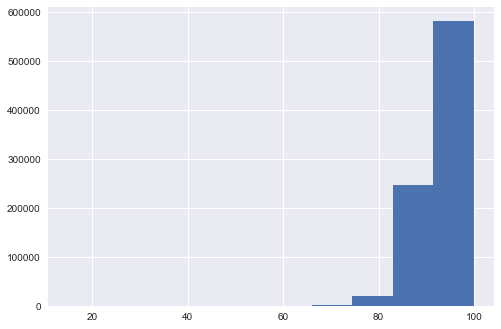

In [129]:
df['latest_score'].hist(bins=10)

In [36]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt

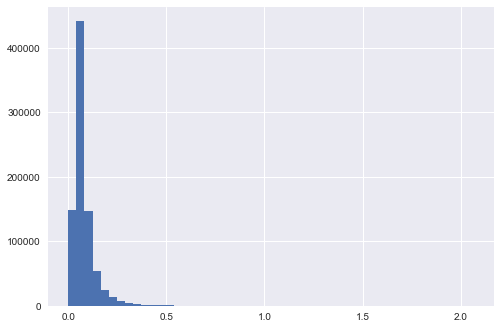

In [37]:
df['years_bt_ins'].hist(bins=50)

In [38]:
#What fraction of businesses don't have a zipcode?
df['zip'].isnull().mean()

1.1777009393342692e-05

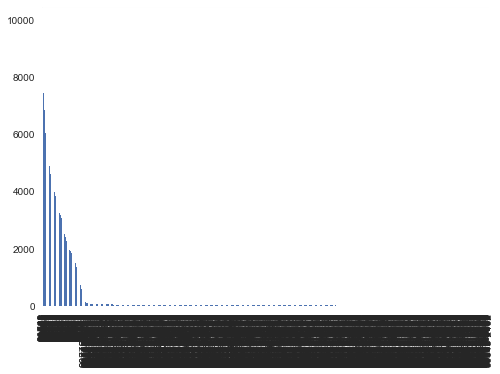

In [39]:
#Spread of businesses over zip code
zipcounts = df['zip'].value_counts()
zipcounts.name = 'counts'
zipcounts.plot('bar')

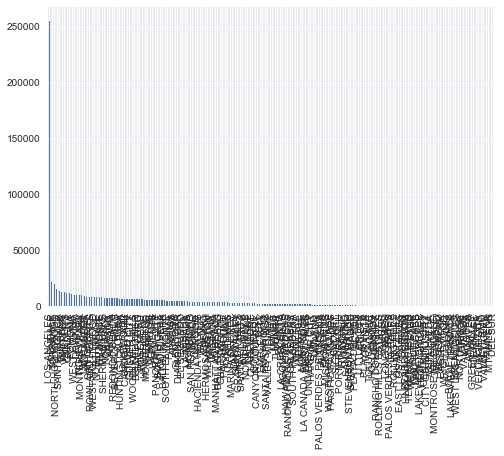

In [40]:
#Spread of businesses over city name
citycounts = df['city'].value_counts()
citycounts.name = 'counts'
citycounts.plot('bar')

In [41]:
#Violations correlated with low scores?
df['violation_code_descr'].value_counts()

# 44. Floors, walls and ceilings: properly built, maintained in good repair and clean      98166
# 33. Nonfood-contact surfaces clean and in good repair                                    96165
# 35. Equipment/Utensils - approved; installed; clean; good repair, capacity               74516
# 40. Plumbing: Plumbing in good repair, proper backflow devices                           48177
# 36. Equipment, utensils and linens: storage and use                                      46699
# 37. Adequate ventilation and lighting; designated areas, use                             45628
# 43. Premises; personal/cleaning items; vermin-proofing                                   40326
# 30. Food properly stored; food storage containers identified                             39074
# 39. Wiping cloths: properly used and stored                                              33758
# 7. Proper hot and cold holding temperatures                                              33330
# 14. Food contact surfaces: c

In [42]:
#how many descriptions are there?
len(df['violation_code_descr'].value_counts())

114

In [44]:
#number of violations
df['num_violations'] = df['violation_code_descr'].value_counts()

In [47]:
df.sort_values('num_violations', ascending=False)[['name', 'num_violations', 'city']].tail(10)

,name,num_violations,city
record_id,,,
PR0004430,ZIGS RESTAURANT,NaN,RESEDA
PR0122896,YOGURT ZONE,NaN,WOODLAND HILLS
PR0191879,CASA HABANERO MEXICAN GRILL,NaN,AZUSA
PR0000642,PUPUSERIA EL SAVOY,NaN,LOS ANGELES
PR0038278,WILLIAMS DONUTS,NaN,SHERMAN OAKS
PR0001900,WIRTSHAUS,NaN,LOS ANGELES
PR0192637,PALACE GARDEN BUFFET,NaN,WEST COVINA
PR0019019,DAMON'S STEAK HOUSE,NaN,GLENDALE
PR0168279,HIBACHI GRILL BUFFET,NaN,PALMDALE


In [48]:
df.head(5)

,date,name,address,city,state,zip,element_code,element_code_descr,service_descr,row_id,...,points,score,grade,count,num_inspect,first_inspect,last_inspect,days_bt_ins,years_bt_ins,num_violations
record_id,,,,,,,,,,,,,,,,,,,,,
PR0166398,2015-06-17,FRESH BROTHERS PIZZA,200 WORLD WAY # T235,LOS ANGELES,CA,90045,1635,RESTAURANT (31-60) SEATS HIGH RISK,ROUTINE INSPECTION,IVBZSG0WC,...,1,93,A,1,44,2015-06-17,2017-03-14,14.790698,0.040522,NaN
PR0034652,2015-06-18,DARK HORSE TAVERN,5507 RESEDA BLVD,TARZANA,CA,91356,1638,RESTAURANT (61-150) SEATS HIGH RISK,ROUTINE INSPECTION,IVU1XQ7ME,...,1,90,A,1,45,2014-12-08,2017-03-23,19.000000,0.052055,NaN
PR0042267,2015-06-18,OUTDOOR GRILL,12630 1/2 WASHINGTON PL,LOS ANGELES,CA,90066,1632,RESTAURANT (0-30) SEATS HIGH RISK,ROUTINE INSPECTION,IVNCSGWZY,...,1,96,A,1,20,2015-01-26,2016-12-07,35.842105,0.098198,NaN
PR0007528,2015-06-17,J.F. INTERNATIONAL,1001 SAN JULIAN ST # A,LOS ANGELES,CA,90015,1610,"FOOD MKT RETAIL (25-1,999 SF) LOW RISK",ROUTINE INSPECTION,IVBRNHZOF,...,0,100,A,1,14,2015-06-17,2016-03-04,20.076923,0.055005,NaN
PR0129590,2015-06-18,DAVE & BUSTERS,6081 CENTER DR,LOS ANGELES,CA,90045,1641,RESTAURANT (151 + ) SEATS HIGH RISK,ROUTINE INSPECTION,IVDZHADY7,...,4,90,A,1,24,2014-12-10,2017-03-21,36.173913,0.099107,NaN


In [52]:
df['violation_code_descr'] = df['violation_code_descr'].map(lambda x: x.lstrip('#1234567890.ab'))

In [53]:
df['violation_code_descr'].value_counts()

 44. Floors, walls and ceilings: properly built, maintained in good repair and clean      98166
 33. Nonfood-contact surfaces clean and in good repair                                    96165
 35. Equipment/Utensils - approved; installed; clean; good repair, capacity               74516
 40. Plumbing: Plumbing in good repair, proper backflow devices                           48177
 36. Equipment, utensils and linens: storage and use                                      46699
 37. Adequate ventilation and lighting; designated areas, use                             45628
 43. Premises; personal/cleaning items; vermin-proofing                                   40326
 30. Food properly stored; food storage containers identified                             39074
 39. Wiping cloths: properly used and stored                                              33758
 7. Proper hot and cold holding temperatures                                              33330
 14. Food contact surfaces: clean and sa

In [58]:
df['violation_code_descr'].str[4]

record_id
PR0166398     
PR0034652     
PR0042267     
PR0007528     
PR0129590    P
PR0164178    P
PR0009768     
PR0010880     
PR0027487     
PR0147781     
PR0157211     
PR0027487     
PR0019868     
PR0152002     
PR0008937    P
PR0146343     
PR0147293     
PR0122041     
PR0129642     
PR0123288     
PR0020615     
PR0013937     
PR0042930     
PR0156756     
PR0156425    T
PR0002740     
PR0137918     
PR0122621     
PR0122565     
PR0129642     
            ..
PR0035194     
PR0011919     
PR0029801    P
PR0035612     
PR0020404     
PR0017324     
PR0026064     
PR0035875     
PR0014729     
PR0019629     
PR0121670     
PR0021733     
PR0034767     
PR0006631     
PR0012263    .
PR0046870     
PR0001865     
PR0003664     
PR0163968     
PR0039499     
PR0004430     
PR0122896     
PR0191879     
PR0000642    .
PR0038278     
PR0001900     
PR0192637     
PR0019019     
PR0168279     
PR0012436     
Name: violation_code_descr, dtype: object

In [59]:
df.dtypes

date                    datetime64[ns]
name                            object
address                         object
city                            object
state                           object
zip                             object
element_code                     int64
element_code_descr              object
service_descr                   object
row_id                          object
violation_code                  object
violation_code_descr            object
points                           int64
score                            int64
grade                           object
count                            int64
num_inspect                      int64
first_inspect           datetime64[ns]
last_inspect            datetime64[ns]
days_bt_ins                    float64
years_bt_ins                   float64
num_violations                 float64
dtype: object

In [60]:
print(df.loc[df['name'] == 'TEST FACILITY - Used for testing purposes'])

Empty DataFrame
Columns: [date, name, address, city, state, zip, element_code, element_code_descr, service_descr, row_id, violation_code, violation_code_descr, points, score, grade, count, num_inspect, first_inspect, last_inspect, days_bt_ins, years_bt_ins, num_violations]
Index: []

[0 rows x 22 columns]


In [61]:
#Sort dataframe by score. Sorted dataframe = result
result = df.sort('score', ascending=True)
result

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:1: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  if __name__ == '__main__':


,date,name,address,city,state,zip,element_code,element_code_descr,service_descr,row_id,...,points,score,grade,count,num_inspect,first_inspect,last_inspect,days_bt_ins,years_bt_ins,num_violations
record_id,,,,,,,,,,,,,,,,,,,,,
PR0150825,2016-12-05,TEST FACILITY - Used for testing purposes,500 1/2 Main ST,ALHAMBRA,CA,90032,1639,RESTAURANT (151 + ) SEATS LOW RISK,ROUTINE INSPECTION,IV0809835,...,2,-7,NaN,1,282,2016-12-05,2017-02-16,0.259786,0.000712,NaN
PR0150825,2016-12-30,TEST FACILITY - Used for testing purposes,500 1/2 Main ST,ALHAMBRA,CA,90032,1639,RESTAURANT (151 + ) SEATS LOW RISK,ROUTINE INSPECTION,IVROZNIN7,...,0,-7,NaN,1,282,2016-12-05,2017-02-16,0.259786,0.000712,NaN
PR0150825,2016-12-30,TEST FACILITY - Used for testing purposes,500 1/2 Main ST,ALHAMBRA,CA,90032,1639,RESTAURANT (151 + ) SEATS LOW RISK,ROUTINE INSPECTION,IV4XVH0EJ,...,0,-7,NaN,1,282,2016-12-05,2017-02-16,0.259786,0.000712,NaN
PR0150825,2016-12-30,TEST FACILITY - Used for testing purposes,500 1/2 Main ST,ALHAMBRA,CA,90032,1639,RESTAURANT (151 + ) SEATS LOW RISK,ROUTINE INSPECTION,IVQQDX28C,...,2,-7,NaN,1,282,2016-12-05,2017-02-16,0.259786,0.000712,NaN
PR0150825,2016-12-30,TEST FACILITY - Used for testing purposes,500 1/2 Main ST,ALHAMBRA,CA,90032,1639,RESTAURANT (151 + ) SEATS LOW RISK,ROUTINE INSPECTION,IVSHUMNVM,...,1,-7,NaN,1,282,2016-12-05,2017-02-16,0.259786,0.000712,NaN
PR0150825,2016-12-30,TEST FACILITY - Used for testing purposes,500 1/2 Main ST,ALHAMBRA,CA,90032,1639,RESTAURANT (151 + ) SEATS LOW RISK,ROUTINE INSPECTION,IVGVQKLGM,...,4,-7,NaN,1,282,2016-12-05,2017-02-16,0.259786,0.000712,NaN
PR0150825,2016-12-05,TEST FACILITY - Used for testing purposes,500 1/2 Main ST,ALHAMBRA,CA,90032,1639,RESTAURANT (151 + ) SEATS LOW RISK,ROUTINE INSPECTION,IV0809879,...,2,-7,NaN,1,282,2016-12-05,2017-02-16,0.259786,0.000712,NaN
PR0150825,2016-12-30,TEST FACILITY - Used for testing purposes,500 1/2 Main ST,ALHAMBRA,CA,90032,1639,RESTAURANT (151 + ) SEATS LOW RISK,ROUTINE INSPECTION,IV09IFE7T,...,4,-7,NaN,1,282,2016-12-05,2017-02-16,0.259786,0.000712,NaN
PR0150825,2016-12-05,TEST FACILITY - Used for testing purposes,500 1/2 Main ST,ALHAMBRA,CA,90032,1639,RESTAURANT (151 + ) SEATS LOW RISK,ROUTINE INSPECTION,IV0809846,...,1,-7,NaN,1,282,2016-12-05,2017-02-16,0.259786,0.000712,NaN


In [62]:
df.head(5)

,date,name,address,city,state,zip,element_code,element_code_descr,service_descr,row_id,...,points,score,grade,count,num_inspect,first_inspect,last_inspect,days_bt_ins,years_bt_ins,num_violations
record_id,,,,,,,,,,,,,,,,,,,,,
PR0166398,2015-06-17,FRESH BROTHERS PIZZA,200 WORLD WAY # T235,LOS ANGELES,CA,90045,1635,RESTAURANT (31-60) SEATS HIGH RISK,ROUTINE INSPECTION,IVBZSG0WC,...,1,93,A,1,44,2015-06-17,2017-03-14,14.790698,0.040522,NaN
PR0034652,2015-06-18,DARK HORSE TAVERN,5507 RESEDA BLVD,TARZANA,CA,91356,1638,RESTAURANT (61-150) SEATS HIGH RISK,ROUTINE INSPECTION,IVU1XQ7ME,...,1,90,A,1,45,2014-12-08,2017-03-23,19.000000,0.052055,NaN
PR0042267,2015-06-18,OUTDOOR GRILL,12630 1/2 WASHINGTON PL,LOS ANGELES,CA,90066,1632,RESTAURANT (0-30) SEATS HIGH RISK,ROUTINE INSPECTION,IVNCSGWZY,...,1,96,A,1,20,2015-01-26,2016-12-07,35.842105,0.098198,NaN
PR0007528,2015-06-17,J.F. INTERNATIONAL,1001 SAN JULIAN ST # A,LOS ANGELES,CA,90015,1610,"FOOD MKT RETAIL (25-1,999 SF) LOW RISK",ROUTINE INSPECTION,IVBRNHZOF,...,0,100,A,1,14,2015-06-17,2016-03-04,20.076923,0.055005,NaN
PR0129590,2015-06-18,DAVE & BUSTERS,6081 CENTER DR,LOS ANGELES,CA,90045,1641,RESTAURANT (151 + ) SEATS HIGH RISK,ROUTINE INSPECTION,IVDZHADY7,...,4,90,A,1,24,2014-12-10,2017-03-21,36.173913,0.099107,NaN


In [63]:
result.head(5)

,date,name,address,city,state,zip,element_code,element_code_descr,service_descr,row_id,...,points,score,grade,count,num_inspect,first_inspect,last_inspect,days_bt_ins,years_bt_ins,num_violations
record_id,,,,,,,,,,,,,,,,,,,,,
PR0150825,2016-12-05,TEST FACILITY - Used for testing purposes,500 1/2 Main ST,ALHAMBRA,CA,90032,1639,RESTAURANT (151 + ) SEATS LOW RISK,ROUTINE INSPECTION,IV0809835,...,2,-7,NaN,1,282,2016-12-05,2017-02-16,0.259786,0.000712,NaN
PR0150825,2016-12-30,TEST FACILITY - Used for testing purposes,500 1/2 Main ST,ALHAMBRA,CA,90032,1639,RESTAURANT (151 + ) SEATS LOW RISK,ROUTINE INSPECTION,IVROZNIN7,...,0,-7,NaN,1,282,2016-12-05,2017-02-16,0.259786,0.000712,NaN
PR0150825,2016-12-30,TEST FACILITY - Used for testing purposes,500 1/2 Main ST,ALHAMBRA,CA,90032,1639,RESTAURANT (151 + ) SEATS LOW RISK,ROUTINE INSPECTION,IV4XVH0EJ,...,0,-7,NaN,1,282,2016-12-05,2017-02-16,0.259786,0.000712,NaN
PR0150825,2016-12-30,TEST FACILITY - Used for testing purposes,500 1/2 Main ST,ALHAMBRA,CA,90032,1639,RESTAURANT (151 + ) SEATS LOW RISK,ROUTINE INSPECTION,IVQQDX28C,...,2,-7,NaN,1,282,2016-12-05,2017-02-16,0.259786,0.000712,NaN
PR0150825,2016-12-30,TEST FACILITY - Used for testing purposes,500 1/2 Main ST,ALHAMBRA,CA,90032,1639,RESTAURANT (151 + ) SEATS LOW RISK,ROUTINE INSPECTION,IVSHUMNVM,...,1,-7,NaN,1,282,2016-12-05,2017-02-16,0.259786,0.000712,NaN


In [64]:
print(df.loc['PR0150825'])

                date                                         name  \
record_id                                                           
PR0150825 2016-12-06  TEST FACILITY   - Used for testing purposes   
PR0150825 2016-12-06  TEST FACILITY   - Used for testing purposes   
PR0150825 2016-12-30  TEST FACILITY   - Used for testing purposes   
PR0150825 2016-12-30  TEST FACILITY   - Used for testing purposes   
PR0150825 2017-01-03  TEST FACILITY   - Used for testing purposes   
PR0150825 2016-12-06  TEST FACILITY   - Used for testing purposes   
PR0150825 2016-12-05  TEST FACILITY   - Used for testing purposes   
PR0150825 2016-12-30  TEST FACILITY   - Used for testing purposes   
PR0150825 2016-12-06  TEST FACILITY   - Used for testing purposes   
PR0150825 2016-12-30  TEST FACILITY   - Used for testing purposes   
PR0150825 2016-12-30  TEST FACILITY   - Used for testing purposes   
PR0150825 2016-12-06  TEST FACILITY   - Used for testing purposes   
PR0150825 2016-12-06  TEST FACILIT

In [72]:
result['violation_sum'] = result.groupby([result.index, 'date'])['count'].transform('sum')

In [74]:
result.head(10)

,date,name,address,city,state,zip,element_code,element_code_descr,service_descr,row_id,...,score,grade,count,num_inspect,first_inspect,last_inspect,days_bt_ins,years_bt_ins,num_violations,violation_sum
record_id,,,,,,,,,,,,,,,,,,,,,
PR0150825,2016-12-05,TEST FACILITY - Used for testing purposes,500 1/2 Main ST,ALHAMBRA,CA,90032,1639,RESTAURANT (151 + ) SEATS LOW RISK,ROUTINE INSPECTION,IV0809835,...,-7,NaN,1,282,2016-12-05,2017-02-16,0.259786,0.000712,NaN,52
PR0150825,2016-12-30,TEST FACILITY - Used for testing purposes,500 1/2 Main ST,ALHAMBRA,CA,90032,1639,RESTAURANT (151 + ) SEATS LOW RISK,ROUTINE INSPECTION,IVROZNIN7,...,-7,NaN,1,282,2016-12-05,2017-02-16,0.259786,0.000712,NaN,84
PR0150825,2016-12-30,TEST FACILITY - Used for testing purposes,500 1/2 Main ST,ALHAMBRA,CA,90032,1639,RESTAURANT (151 + ) SEATS LOW RISK,ROUTINE INSPECTION,IV4XVH0EJ,...,-7,NaN,1,282,2016-12-05,2017-02-16,0.259786,0.000712,NaN,84
PR0150825,2016-12-30,TEST FACILITY - Used for testing purposes,500 1/2 Main ST,ALHAMBRA,CA,90032,1639,RESTAURANT (151 + ) SEATS LOW RISK,ROUTINE INSPECTION,IVQQDX28C,...,-7,NaN,1,282,2016-12-05,2017-02-16,0.259786,0.000712,NaN,84
PR0150825,2016-12-30,TEST FACILITY - Used for testing purposes,500 1/2 Main ST,ALHAMBRA,CA,90032,1639,RESTAURANT (151 + ) SEATS LOW RISK,ROUTINE INSPECTION,IVSHUMNVM,...,-7,NaN,1,282,2016-12-05,2017-02-16,0.259786,0.000712,NaN,84
PR0150825,2016-12-30,TEST FACILITY - Used for testing purposes,500 1/2 Main ST,ALHAMBRA,CA,90032,1639,RESTAURANT (151 + ) SEATS LOW RISK,ROUTINE INSPECTION,IVGVQKLGM,...,-7,NaN,1,282,2016-12-05,2017-02-16,0.259786,0.000712,NaN,84
PR0150825,2016-12-05,TEST FACILITY - Used for testing purposes,500 1/2 Main ST,ALHAMBRA,CA,90032,1639,RESTAURANT (151 + ) SEATS LOW RISK,ROUTINE INSPECTION,IV0809879,...,-7,NaN,1,282,2016-12-05,2017-02-16,0.259786,0.000712,NaN,52
PR0150825,2016-12-30,TEST FACILITY - Used for testing purposes,500 1/2 Main ST,ALHAMBRA,CA,90032,1639,RESTAURANT (151 + ) SEATS LOW RISK,ROUTINE INSPECTION,IV09IFE7T,...,-7,NaN,1,282,2016-12-05,2017-02-16,0.259786,0.000712,NaN,84
PR0150825,2016-12-05,TEST FACILITY - Used for testing purposes,500 1/2 Main ST,ALHAMBRA,CA,90032,1639,RESTAURANT (151 + ) SEATS LOW RISK,ROUTINE INSPECTION,IV0809846,...,-7,NaN,1,282,2016-12-05,2017-02-16,0.259786,0.000712,NaN,52


In [76]:
results = result.set_index(['date'], append=True)

In [77]:
results.head(5)

name  \
record_id date                                                      
PR0150825 2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   

                              address      city state    zip  element_code  \
record_id date                                                               
PR0150825 2016-12-05  500 1/2 Main ST  ALHAMBRA    CA  90032          1639   
          2016-12-30  500 1/2 Main ST  ALHAMBRA    CA  90032          1639   
          2016-12-30  500 1/2 Main ST  ALHAMBRA    CA  90032          1639   
          2016-12-30  500 1/2 Main ST  ALHAMBRA    CA  90032          1639   
          2016-12-30  500 1/2 Main ST  ALHAMBRA    CA  90032          1639   

                                      element_code_descr       service_descr  \
record_id date                                                                 
PR0150825 2016-12-05  RESTAURANT (151 + ) SEATS LOW RISK  ROUTINE INSPECTION   
          2016-12-30  RESTAURANT (151 + ) SEATS LOW RISK  ROUTINE INSPECTION   
          2016-12-30  RESTAURANT (151 + ) SEATS LOW RISK  ROUTINE INSPECTION   
          2016-12-30  RESTAURANT (151 + ) SEATS LOW RISK  ROUTINE INSPECTION   
          2016-12-30  RESTAURANT (151 + ) SEATS LOW RISK  ROUTINE INSPECTION   

                         row_id violation_code      ...       score  grade  \
record_id date                                      ...                      
PR0150825 2016-12-05  IV0809835         16F019      ...          -7    NaN   
          2016-12-30  IVROZNIN7         16F049      ...          -7    NaN   
          2016-12-30  IV4XVH0EJ         16F047      ...          -7    NaN   
          2016-12-30  IVQQDX28C         16F012      ...          -7    NaN   
          2016-12-30  IVSHUMNVM         16F035      ...          -7    NaN   

                      count num_inspect  first_inspect  last_inspect  \
record_id date                                                         
PR0150825 2016-12-05      1         282     2016-12-05    2017-02-16   
          2016-12-30      1         282     2016-12-05    2017-02-16   
          2016-12-30      1         282     2016-12-05    2017-02-16   
          2016-12-30      1         282     2016-12-05    2017-02-16   
          2016-12-30      1         282     2016-12-05    2017-02-16   

                     days_bt_ins years_bt_ins  num_violations  violation_sum  
record_id date                                                                
PR0150825 2016-12-05    0.259786     0.000712             NaN             52  
          2016-12-30    0.259786     0.000712             NaN             84  
          2016-12-30    0.259786     0.000712             NaN             84  
          2016-12-30    0.259786     0.000712             NaN             84  
          2016-12-30    0.259786     0.000712             NaN             84  

[5 rows x 22 columns]

In [ ]:
results['violation_sum'] = results.groupby([results.index, 'date'])['count'].transform('sum')
data.groupby(['record_id', 'date'])['count'].count()

In [78]:
results['violation_sum'] = results.groupby([results.index])['count'].transform('sum')

In [81]:
results.tail(10)

,,name,address,city,state,zip,element_code,element_code_descr,service_descr,row_id,violation_code,...,score,grade,count,num_inspect,first_inspect,last_inspect,days_bt_ins,years_bt_ins,num_violations,violation_sum
record_id,date,,,,,,,,,,,,,,,,,,,,,
PR0003954,2017-01-03,SKAF'S GRILL,6008 LAUREL CANYON BLVD,NORTH HOLLYWOOD,CA,91606,1632,RESTAURANT (0-30) SEATS HIGH RISK,ROUTINE INSPECTION,IVCLZW1AE,16W020,...,100,A,1,25,2015-01-06,2017-01-03,30.333333,0.083105,NaN,8
PR0129051,2016-10-27,ARSHO MEAT PRODUCTS,6743 BAKMAN AVE,NORTH HOLLYWOOD,CA,91606-1988,1610,"FOOD MKT RETAIL (25-1,999 SF) LOW RISK",ROUTINE INSPECTION,IVTG6Z02H,16W052,...,100,A,1,6,2015-07-08,2016-10-27,95.400000,0.261370,NaN,3
PR0152925,2015-02-11,TACOS ACAPUILCO,730 S BROADWAY ST,LOS ANGELES,CA,90014,1632,RESTAURANT (0-30) SEATS HIGH RISK,ROUTINE INSPECTION,IVRYD1JQH,16W005,...,100,A,1,24,2014-11-17,2016-09-07,28.695652,0.078618,NaN,4
PR0007528,2015-06-17,J.F. INTERNATIONAL,1001 SAN JULIAN ST # A,LOS ANGELES,CA,90015,1610,"FOOD MKT RETAIL (25-1,999 SF) LOW RISK",ROUTINE INSPECTION,IVUUUHHFM,16W023,...,100,A,1,14,2015-06-17,2016-03-04,20.076923,0.055005,NaN,10
PR0001379,2015-08-13,PIAZZA LOUNGE REMOTE PREP.,8500 BEVERLY BLVD # 630,LOS ANGELES,CA,90048,1631,RESTAURANT (0-30) SEATS MODERATE RISK,ROUTINE INSPECTION,IVVRNXZ2P,16W051,...,100,A,1,31,2014-10-15,2017-02-28,28.900000,0.079178,NaN,4
PR0028625,2016-04-27,GOURMET IMPORTS,961 S MERIDIAN AVE,ALHAMBRA,CA,91803,1611,"FOOD MKT RETAIL (25-1,999 SF) MODERATE RISK",ROUTINE INSPECTION,IVII2SVPW,16W019,...,100,A,1,4,2016-04-27,2016-04-27,0.000000,0.000000,NaN,4
PR0022327,2016-02-04,MARKET PLACE SWEDE SHOP,600 N SAN FERNANDO BLVD,BURBANK,CA,91502,1610,"FOOD MKT RETAIL (25-1,999 SF) LOW RISK",ROUTINE INSPECTION,IVQEQM90I,16SF15,...,100,A,1,2,2016-02-04,2016-09-01,210.000000,0.575342,NaN,1
PR0022488,2016-10-03,CAULFIELD'S PREP ROOM BASEME,9360 WILSHIRE BLVD,BEVERLY HILLS,CA,90212,1630,RESTAURANT (0-30) SEATS LOW RISK,ROUTINE INSPECTION,IV63QOTQJ,16W011,...,100,A,1,12,2014-10-16,2016-10-03,65.272727,0.178829,NaN,5
PR0032144,2015-01-29,BIBIGO-REMOTE STORAGE,10250 SANTA MONICA BLVD SECIO,LOS ANGELES,CA,90067,1630,RESTAURANT (0-30) SEATS LOW RISK,ROUTINE INSPECTION,IVC787ON7,16W023,...,100,A,1,5,2015-01-29,2016-01-06,85.500000,0.234247,NaN,3


In [82]:
results.drop(['PR0150825'])

name  \
record_id date                                                      
PR0150825 2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
...                                                           ...   
PR0151756 2014-10-03                                     HOLY COW   
PR0032144 2016-01-06                        BIBIGO-REMOTE STORAGE   
PR0148525 2017-03-28              GREEN CRUSH CERRITOS-REMOTE 337   
PR0006630 2015-12-28                                  EL PAYASITO   
PR0004076 2014-12-12                 PINKBERRY REMOTE STORAGE/PRE   
PR0022488 2016-10-03                 CAULFIELD'S PREP ROOM BASEME   
PR0146336 2017-03-15              THE COFFEE BEAN & TEA LEAF #329   
PR0007528 2015-06-17                           J.F. INTERNATIONAL   
PR0037754 2015-06-15                                 WENDY'S # 27   
PR0032332 2017-02-17                                     EL SUPER   
PR0148525 2017-03-28              GREEN CRUSH CERRITOS-REMOTE 337   
PR0031311 2017-01-11                    24 HOUR FITNESS CLUB #916   
PR0017337 2014-12-04                       EL PARAISO SALVADORENO   
PR0031236 2015-11-10                 MOTHERS NUTRITIONAL CTR #405   
PR0152925 2015-02-11                              TACOS ACAPUILCO   
PR0007528 2015-06-17                           J.F. INTERNATIONAL   
PR0001379 2015-08-13                   PIAZZA LOUNGE REMOTE PREP.   
PR0037754 2015-06-15                                 WENDY'S # 27   
PR0032332 2017-02-17                                     EL SUPER   
PR0028625 2016-04-27                              GOURMET IMPORTS   
PR0003954 2017-01-03                                 SKAF'S GRILL   
PR0129051 2016-10-27                          ARSHO MEAT PRODUCTS   
PR0152925 2015-02-11                              TACOS ACAPUILCO   
PR0007528 2015-06-17                           J.F. INTERNATIONAL   
PR0001379 2015-08-13                   PIAZZA LOUNGE REMOTE PREP.   
PR0028625 2016-04-27                              GOURMET I

In [83]:
results.head(10)

name  \
record_id date                                                      
PR0150825 2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   

                              address      city state    zip  element_code  \
record_id date                                                               
PR0150825 2016-12-05  500 1/2 Main ST  ALHAMBRA    CA  90032          1639   
          2016-12-30  500 1/2 Main ST  ALHAMBRA    CA  90032          1639   
          2016-12-30  500 1/2 Main ST  ALHAMBRA    CA  90032          1639   
          2016-12-30  500 1/2 Main ST  ALHAMBRA    CA  90032          1639   
          2016-12-30  500 1/2 Main ST  ALHAMBRA    CA  90032          1639   
          2016-12-30  500 1/2 Main ST  ALHAMBRA    CA  90032          1639   
          2016-12-05  500 1/2 Main ST  ALHAMBRA    CA  90032          1639   
          2016-12-30  500 1/2 Main ST  ALHAMBRA    CA  90032          1639   
          2016-12-05  500 1/2 Main ST  ALHAMBRA    CA  90032          1639   
          2016-12-30  500 1/2 Main ST  ALHAMBRA    CA  90032          1639   

                                      element_code_descr       service_descr  \
record_id date                                                                 
PR0150825 2016-12-05  RESTAURANT (151 + ) SEATS LOW RISK  ROUTINE INSPECTION   
          2016-12-30  RESTAURANT (151 + ) SEATS LOW RISK  ROUTINE INSPECTION   
          2016-12-30  RESTAURANT (151 + ) SEATS LOW RISK  ROUTINE INSPECTION   
          2016-12-30  RESTAURANT (151 + ) SEATS LOW RISK  ROUTINE INSPECTION   
          2016-12-30  RESTAURANT (151 + ) SEATS LOW RISK  ROUTINE INSPECTION   
          2016-12-30  RESTAURANT (151 + ) SEATS LOW RISK  ROUTINE INSPECTION   
          2016-12-05  RESTAURANT (151 + ) SEATS LOW RISK  ROUTINE INSPECTION   
          2016-12-30  RESTAURANT (151 + ) SEATS LOW RISK  ROUTINE INSPECTION   
          2016-12-05  RESTAURANT (151 + ) SEATS LOW RISK  ROUTINE INSPECTION   
          2016-12-30  RESTAURANT (151 + ) SEATS LOW RISK  ROUTINE INSPECTION   

                         row_id violation_code      ...       score  grade  \
record_id date                                      ...                      
PR0150825 2016-12-05  IV0809835         16F019      ...          -7    NaN   
          2016-12-30  IVROZNIN7         16F049      ...          -7    NaN   
          2016-12-30  IV4XVH0EJ         16F047      ...          -7    NaN   
          2016-12-30  IVQQDX28C         16F012      ...          -7    NaN   
          2016-12-30  IVSHUMNVM         16F035      ...          -7    NaN   
          2016-12-30  IVGVQKLGM         16F013      ...          -7    NaN   
          2016-12-05  IV0809879         16F012      ...          -7    NaN   
          2016-12-30  IV09IFE7T         16F023      ...          -7    NaN   
          2016-12-05  IV0809846         16F037      ...          -7    NaN   
          2016-12-30  IVDVP0978         16F018      ...          -7    NaN   

                      count num_inspect  first_inspect  last_inspect  \
record_id date                                                         
PR0150825 2016-12-05      1         282     2016-12-05    2017-02-16   
          2016-12-30      1         282     2016-12-05    2017-02-16   
          2016-12-30      1         282     2016-12-05    2017-02-16   
          2016-12-30      1         2

In [84]:
results.drop('num_violations', axis=1)

name  \
record_id date                                                      
PR0150825 2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
          2016-12-05  TEST FACILITY   - Used for testing purposes   
          2016-12-30  TEST FACILITY   - Used for testing purposes   
...                                                           ...   
PR0151756 2014-10-03                                     HOLY COW   
PR0032144 2016-01-06                        BIBIGO-REMOTE STORAGE   
PR0148525 2017-03-28              GREEN CRUSH CERRITOS-REMOTE 337   
PR0006630 2015-12-28                                  EL PAYASITO   
PR0004076 2014-12-12                 PINKBERRY REMOTE STORAGE/PRE   
PR0022488 2016-10-03                 CAULFIELD'S PREP ROOM BASEME   
PR0146336 2017-03-15              THE COFFEE BEAN & TEA LEAF #329   
PR0007528 2015-06-17                           J.F. INTERNATIONAL   
PR0037754 2015-06-15                                 WENDY'S # 27   
PR0032332 2017-02-17                                     EL SUPER   
PR0148525 2017-03-28              GREEN CRUSH CERRITOS-REMOTE 337   
PR0031311 2017-01-11                    24 HOUR FITNESS CLUB #916   
PR0017337 2014-12-04                       EL PARAISO SALVADORENO   
PR0031236 2015-11-10                 MOTHERS NUTRITIONAL CTR #405   
PR0152925 2015-02-11                              TACOS ACAPUILCO   
PR0007528 2015-06-17                           J.F. INTERNATIONAL   
PR0001379 2015-08-13                   PIAZZA LOUNGE REMOTE PREP.   
PR0037754 2015-06-15                                 WENDY'S # 27   
PR0032332 2017-02-17                                     EL SUPER   
PR0028625 2016-04-27                              GOURMET IMPORTS   
PR0003954 2017-01-03                                 SKAF'S GRILL   
PR0129051 2016-10-27                          ARSHO MEAT PRODUCTS   
PR0152925 2015-02-11                              TACOS ACAPUILCO   
PR0007528 2015-06-17                           J.F. INTERNATIONAL   
PR0001379 2015-08-13                   PIAZZA LOUNGE REMOTE PREP.   
PR0028625 2016-04-27                              GOURMET I

In [101]:
results = results.reset_index(level=1)

In [107]:
#Drop observations with test facilities
rresults = results.drop(['PR0150825'])

In [108]:
rresults = rresults.set_index(['date'], append=True)

In [109]:
rresults.sortlevel(1)

name                         address  \
record_id date                                                                  
PR0000152 2014-10-01   HILLCREST COUNTRY CLUB               10000 W PICO BLVD   
          2014-10-01   HILLCREST COUNTRY CLUB               10000 W PICO BLVD   
          2014-10-01   HILLCREST COUNTRY CLUB               10000 W PICO BLVD   
          2014-10-01   HILLCREST COUNTRY CLUB               10000 W PICO BLVD   
          2014-10-01   HILLCREST COUNTRY CLUB               10000 W PICO BLVD   
          2014-10-01   HILLCREST COUNTRY CLUB               10000 W PICO BLVD   
PR0000338 2014-10-01           ODESSA GROCERY          7781 SANTA MONICA BLVD   
          2014-10-01           ODESSA GROCERY          7781 SANTA MONICA BLVD   
          2014-10-01           ODESSA GROCERY          7781 SANTA MONICA BLVD   
          2014-10-01           ODESSA GROCERY          7781 SANTA MONICA BLVD   
          2014-10-01           ODESSA GROCERY          7781 SANTA MONICA BLVD   
          2014-10-01           ODESSA GROCERY          7781 SANTA MONICA BLVD   
          2014-10-01           ODESSA GROCERY          7781 SANTA MONICA BLVD   
PR0000533 2014-10-01   BEST PRODUCE & GROCERY                  312 E MAPLE ST   
          2014-10-01   BEST PRODUCE & GROCERY                  312 E MAPLE ST   
PR0000750 2014-10-01                     HAMA                213 WINDWARD AVE   
          2014-10-01                     HAMA                213 WINDWARD AVE   
          2014-10-01                     HAMA                213 WINDWARD AVE   
          2014-10-01                     HAMA                213 WINDWARD AVE   
PR0000758 2014-10-01  L & L HAWAIIAN BARBECUE          515 N GRAND AVE STE #C   
          2014-10-01  L & L HAWAIIAN BARBECUE          515 N GRAND AVE STE #C   
          2014-10-01  L & L HAWAIIAN BARBECUE          515 N GRAND AVE STE #C   
          2014-10-01  L & L HAWAIIAN BARBECUE          515 N GRAND AVE STE #C   
          2014-10-01  L & L HAWAIIAN BARBECUE          515 N GRAND AVE STE #C   
          2014-10-01  L & L HAWAIIAN BARBECUE          515 N GRAND AVE STE #C   
          2014-10-01  L & L HAWAIIAN BARBECUE          515 N GRAND AVE STE #C   
PR0001001 2014-10-01                 ROCKWELL              1712 N VERMONT AVE   
          2014-10-01                 ROCKWELL              1712 N VERMONT AVE   
          2014-10-01                 ROCKWELL              1712 N VERMONT AVE   
          2014-10-01                 ROCKWELL              1712 N VERMONT AVE   
...                                       ...                             ...   
PR0191256 2017-03-31                    IMART            269 S LOS ANGELES ST   
          2017-03-31                    IMART            269 S LOS ANGELES ST   
          2017-03-31                    IMART            269 S LOS ANGELES ST   
PR0191403 2017-03-31        DOU DOU ICE CREAM  500 LAKEWOOD CENTER MALL KT231   
          2017-03-31        DOU DOU ICE CREAM  500 LAKEWOOD CENTER MALL KT231   
          2017-03-31        DOU DOU ICE CREAM  500 LAKEWOOD CENTER MALL KT231   
          2017-03-31        DOU DOU ICE CREAM  500 LAKEWOOD CENTER MALL KT231   
PR0192011 2017-03-31          GRANNY''S DONUT               5550 WOODRUFF AVE   
          2017-03-31          GRANNY''S DONUT               5550 WOODRUFF AVE   
          2017-03-31          GRANNY''S DONUT               5550 WOODRUFF AVE   
          2017-03-31          GRANNY''S DONUT               5550 WOODRUFF AVE   
PR0192537 2017-03-31            COSTA KITCHEN          15716 1/2 PIONEER BLVD   
          2017-03-31            COSTA KITCHEN          15716 1/2 PIONEER BLVD   
          2017-03-31            COSTA KITCHEN          15716 1/2 PIONEER BLVD   
          2017-03-31            COSTA KITCHEN          15716 1/2 PIONEER BLVD   
PR0192749 2017-03-31        SUPER FISH MARKET           11007 S CRENSHAW BLVD   
          2017-03-31        SUPER FISH MARKET           11007 S CRENSHAW

In [110]:
rresults['points_sum'] = rresults.groupby([rresults.index])['points'].transform('sum')

In [114]:
rresults.sortlevel(['record_id','date'])

name                  address  \
record_id date                                                       
PR0000002 2014-12-29          GLADSTONE'S  17300 PACIFIC COAST HWY   
          2014-12-29          GLADSTONE'S  17300 PACIFIC COAST HWY   
          2014-12-29          GLADSTONE'S  17300 PACIFIC COAST HWY   
          2014-12-29          GLADSTONE'S  17300 PACIFIC COAST HWY   
          2014-12-29          GLADSTONE'S  17300 PACIFIC COAST HWY   
          2014-12-29          GLADSTONE'S  17300 PACIFIC COAST HWY   
          2015-06-13          GLADSTONE'S  17300 PACIFIC COAST HWY   
          2015-09-08          GLADSTONE'S  17300 PACIFIC COAST HWY   
          2016-01-13          GLADSTONE'S  17300 PACIFIC COAST HWY   
          2016-08-10          GLADSTONE'S  17300 PACIFIC COAST HWY   
          2017-02-16          GLADSTONE'S  17300 PACIFIC COAST HWY   
          2017-02-16          GLADSTONE'S  17300 PACIFIC COAST HWY   
PR0000003 2014-11-26      BURRITO FACTORY       1902 S PACIFIC AVE   
          2014-11-26      BURRITO FACTORY       1902 S PACIFIC AVE   
          2014-11-26      BURRITO FACTORY       1902 S PACIFIC AVE   
          2014-11-26      BURRITO FACTORY       1902 S PACIFIC AVE   
          2014-11-26      BURRITO FACTORY       1902 S PACIFIC AVE   
          2014-11-26      BURRITO FACTORY       1902 S PACIFIC AVE   
          2015-09-08      BURRITO FACTORY       1902 S PACIFIC AVE   
          2015-09-08      BURRITO FACTORY       1902 S PACIFIC AVE   
          2015-09-08      BURRITO FACTORY       1902 S PACIFIC AVE   
          2015-09-08      BURRITO FACTORY       1902 S PACIFIC AVE   
          2015-09-08      BURRITO FACTORY       1902 S PACIFIC AVE   
          2015-09-08      BURRITO FACTORY       1902 S PACIFIC AVE   
          2015-09-08      BURRITO FACTORY       1902 S PACIFIC AVE   
          2016-01-28      BURRITO FACTORY       1902 S PACIFIC AVE   
          2016-01-28      BURRITO FACTORY       1902 S PACIFIC AVE   
          2016-01-28      BURRITO FACTORY       1902 S PACIFIC AVE   
          2016-01-28      BURRITO FACTORY       1902 S PACIFIC AVE   
          2016-01-28      BURRITO FACTORY       1902 S PACIFIC AVE   
...                                   ...                      ...   
PR0193162 2017-03-29        J & E LIQOURS         7911 FIGUEROA ST   
          2017-03-29        J & E LIQOURS         7911 FIGUEROA ST   
PR0193165 2017-03-24            FISH TRAP  4350 LAUREL CANYON BLVD   
          2017-03-24            FISH TRAP  4350 LAUREL CANYON BLVD   
          2017-03-24            FISH TRAP  4350 LAUREL CANYON BLVD   
          2017-03-24            FISH TRAP  4350 LAUREL CANYON BLVD   
          2017-03-24            FISH TRAP  4350 LAUREL CANYON BLVD   
PR0193175 2017-03-29  KICKIN CRAB EXPRESS    133 LOS CERRITOS MALL   
          2017-03-29  KICKIN CRAB EXPRESS    133 LOS CERRITOS MALL   
          2017-03-29  KICKIN CRAB EXPRESS    133 LOS CERRITOS MALL   
          2017-03-29  KICKIN CRAB EXPRESS    133 LOS CERRITOS MALL   
          2017-03-29  KICKIN CRAB EXPRESS    133 LOS CERRITOS MALL   
PR0193211 2017-03-29      JOHNNY'S LIQUOR       2615 FAIR OAKS AVE   
          2017-03-29      JOHNNY'S LIQUOR       2615 FAIR OAKS AVE   
          2017-03-29      JOHNNY'S LIQUOR       2615 FAIR OAKS AVE   
          2017-03-29      JOHNNY'S LIQUOR       2615 FAIR OAKS AVE   
          2017-03-29      JOHNNY'S LIQUOR       2615 FAIR OAKS AVE   
          2017-03-29      JOHNNY'S LIQUOR       2615 FAIR OAKS AVE   
          2017-03-29      JOHNNY'S LIQUOR       2615 FAIR OAKS AVE   
          2017-03-29      JOHNNY'S LIQUOR       2615 FAIR OAKS AVE   
PR0193244 2017-03-30           UMAMI CAFE          2555 E AVENUE P   
          2017-03-30           UMAMI CAFE          2555 E AVENUE P   
          2017-03-30           UMAMI CAFE          2555 E AVENUE P   
          2017-03-30           UMAMI CAFE          2555 E AVENUE P   
PR0193247 2017-03-30         HIEDI'S CAFE      

In [118]:
#points_sum represents the total number of points deducted
rresults = rresults.rename(columns = {'points_sum':'points_deducted'})

In [132]:
rresults.sort_values('points_deducted', ascending=True)[['name', 'city', 'grade', 'points', 'score', 'violation_sum', 'points_deducted']].tail(13)

name             city grade  \
record_id date                                                            
PR0015844 2015-06-23  GOLDEN CITY BBQ RESTAURANT    MONTEREY PARK    SC   
PR0168337 2017-02-22           YAMATO RESTAURANT  STEVENSON RANCH    SC   
          2017-02-22           YAMATO RESTAURANT  STEVENSON RANCH    SC   
          2017-02-22           YAMATO RESTAURANT  STEVENSON RANCH    SC   
          2017-02-22           YAMATO RESTAURANT  STEVENSON RANCH    SC   
          2017-02-22           YAMATO RESTAURANT  STEVENSON RANCH    SC   
          2017-02-22           YAMATO RESTAURANT  STEVENSON RANCH    SC   
          2017-02-22           YAMATO RESTAURANT  STEVENSON RANCH    SC   
          2017-02-22           YAMATO RESTAURANT  STEVENSON RANCH    SC   
          2017-02-22           YAMATO RESTAURANT  STEVENSON RANCH    SC   
          2017-02-22           YAMATO RESTAURANT  STEVENSON RANCH    SC   
          2017-02-22           YAMATO RESTAURANT  STEVENSON RANCH    SC   
          2017-02-22           YAMATO RESTAURANT  STEVENSON RANCH    SC   

                      points  score  violation_sum  points_deducted  
record_id date                                                       
PR0015844 2015-06-23       2     63             21               37  
PR0168337 2017-02-22       1     62             12               38  
          2017-02-22       1     62             12               38  
          2017-02-22      11     62             12               38  
          2017-02-22       0     62             12               38  
          2017-02-22       1     62             12               38  
          2017-02-22       2     62             12               38  
          2017-02-22       4     62             12               38  
          2017-02-22       1     62             12               38  
          2017-02-22       1     62             12               38  
          2017-02-22       4     62             12               38  
          2017-02-22      11     62             12               38  
          2017-02-22       1     62             12               38

In [148]:
rr = rresults.reset_index()

In [149]:
rp = rr.set_index(['record_id', 'date', 'grade'])

In [152]:
rp.tail(10)

,,,name,address,city,state,zip,element_code,element_code_descr,service_descr,row_id,violation_code,...,score,count,num_inspect,first_inspect,last_inspect,days_bt_ins,years_bt_ins,num_violations,violation_sum,points_deducted
record_id,date,grade,,,,,,,,,,,,,,,,,,,,,
PR0003954,2017-01-03,A,SKAF'S GRILL,6008 LAUREL CANYON BLVD,NORTH HOLLYWOOD,CA,91606,1632,RESTAURANT (0-30) SEATS HIGH RISK,ROUTINE INSPECTION,IVCLZW1AE,16W020,...,100,1,25,2015-01-06,2017-01-03,30.333333,0.083105,NaN,8,3
PR0129051,2016-10-27,A,ARSHO MEAT PRODUCTS,6743 BAKMAN AVE,NORTH HOLLYWOOD,CA,91606-1988,1610,"FOOD MKT RETAIL (25-1,999 SF) LOW RISK",ROUTINE INSPECTION,IVTG6Z02H,16W052,...,100,1,6,2015-07-08,2016-10-27,95.400000,0.261370,NaN,3,0
PR0152925,2015-02-11,A,TACOS ACAPUILCO,730 S BROADWAY ST,LOS ANGELES,CA,90014,1632,RESTAURANT (0-30) SEATS HIGH RISK,ROUTINE INSPECTION,IVRYD1JQH,16W005,...,100,1,24,2014-11-17,2016-09-07,28.695652,0.078618,NaN,4,0
PR0007528,2015-06-17,A,J.F. INTERNATIONAL,1001 SAN JULIAN ST # A,LOS ANGELES,CA,90015,1610,"FOOD MKT RETAIL (25-1,999 SF) LOW RISK",ROUTINE INSPECTION,IVUUUHHFM,16W023,...,100,1,14,2015-06-17,2016-03-04,20.076923,0.055005,NaN,10,0
PR0001379,2015-08-13,A,PIAZZA LOUNGE REMOTE PREP.,8500 BEVERLY BLVD # 630,LOS ANGELES,CA,90048,1631,RESTAURANT (0-30) SEATS MODERATE RISK,ROUTINE INSPECTION,IVVRNXZ2P,16W051,...,100,1,31,2014-10-15,2017-02-28,28.900000,0.079178,NaN,4,0
PR0028625,2016-04-27,A,GOURMET IMPORTS,961 S MERIDIAN AVE,ALHAMBRA,CA,91803,1611,"FOOD MKT RETAIL (25-1,999 SF) MODERATE RISK",ROUTINE INSPECTION,IVII2SVPW,16W019,...,100,1,4,2016-04-27,2016-04-27,0.000000,0.000000,NaN,4,0
PR0022327,2016-02-04,A,MARKET PLACE SWEDE SHOP,600 N SAN FERNANDO BLVD,BURBANK,CA,91502,1610,"FOOD MKT RETAIL (25-1,999 SF) LOW RISK",ROUTINE INSPECTION,IVQEQM90I,16SF15,...,100,1,2,2016-02-04,2016-09-01,210.000000,0.575342,NaN,1,0
PR0022488,2016-10-03,A,CAULFIELD'S PREP ROOM BASEME,9360 WILSHIRE BLVD,BEVERLY HILLS,CA,90212,1630,RESTAURANT (0-30) SEATS LOW RISK,ROUTINE INSPECTION,IV63QOTQJ,16W011,...,100,1,12,2014-10-16,2016-10-03,65.272727,0.178829,NaN,5,0
PR0032144,2015-01-29,A,BIBIGO-REMOTE STORAGE,10250 SANTA MONICA BLVD SECIO,LOS ANGELES,CA,90067,1630,RESTAURANT (0-30) SEATS LOW RISK,ROUTINE INSPECTION,IVC787ON7,16W023,...,100,1,5,2015-01-29,2016-01-06,85.500000,0.234247,NaN,3,0


In [158]:
rd = rp.sort_values('points_deducted', ascending=True)[['name', 'city', 'points', 'score', 'violation_sum', 'points_deducted']]

In [160]:
rd.head(13)

,,,name,city,points,score,violation_sum,points_deducted
record_id,date,grade,,,,,,
PR0161401,2015-04-22,SC,RIOT CAFE,LOS ANGELES,0,0,3,0
PR0045757,2016-03-02,A,BEVERAGE WAREHOUSE,LOS ANGELES,0,100,1,0
PR0022488,2016-10-03,A,CAULFIELD'S PREP ROOM BASEME,BEVERLY HILLS,0,100,5,0
PR0019444,2015-02-04,A,STARBUCKS COFFEE #5720,TORRANCE,0,100,1,0
PR0022488,2016-10-03,A,CAULFIELD'S PREP ROOM BASEME,BEVERLY HILLS,0,100,5,0
PR0151756,2015-01-15,A,HOLY COW,SANTA MONICA,0,100,1,0
PR0152925,2015-02-11,A,TACOS ACAPUILCO,LOS ANGELES,0,100,4,0
PR0001379,2015-08-13,A,PIAZZA LOUNGE REMOTE PREP.,LOS ANGELES,0,100,4,0
PR0022488,2016-10-03,A,CAULFIELD'S PREP ROOM BASEME,BEVERLY HILLS,0,100,5,0


In [162]:
rd.sortlevel(0)

name               city  points  \
record_id date       grade                                                   
PR0000002 2014-12-29 A              GLADSTONE'S  PACIFIC PALISADES       1   
                     A              GLADSTONE'S  PACIFIC PALISADES       1   
                     A              GLADSTONE'S  PACIFIC PALISADES       1   
                     A              GLADSTONE'S  PACIFIC PALISADES       1   
                     A              GLADSTONE'S  PACIFIC PALISADES       1   
                     A              GLADSTONE'S  PACIFIC PALISADES       1   
          2015-06-13 A              GLADSTONE'S  PACIFIC PALISADES       1   
          2015-09-08 A              GLADSTONE'S  PACIFIC PALISADES       1   
          2016-01-13 A              GLADSTONE'S  PACIFIC PALISADES       1   
          2016-08-10 A              GLADSTONE'S  PACIFIC PALISADES       1   
          2017-02-16 A              GLADSTONE'S  PACIFIC PALISADES       1   
                     A              GLADSTONE'S  PACIFIC PALISADES       1   
PR0000003 2014-11-26 A          BURRITO FACTORY          SAN PEDRO       1   
                     A          BURRITO FACTORY          SAN PEDRO       2   
                     A          BURRITO FACTORY          SAN PEDRO       1   
                     A          BURRITO FACTORY          SAN PEDRO       1   
                     A          BURRITO FACTORY          SAN PEDRO       2   
                     A          BURRITO FACTORY          SAN PEDRO       1   
          2015-09-08 A          BURRITO FACTORY          SAN PEDRO       1   
                     A          BURRITO FACTORY          SAN PEDRO       1   
                     A          BURRITO FACTORY          SAN PEDRO       1   
                     A          BURRITO FACTORY          SAN PEDRO       1   
                     A          BURRITO FACTORY          SAN PEDRO       1   
                     A          BURRITO FACTORY          SAN PEDRO       1   
                     A          BURRITO FACTORY          SAN PEDRO       2   
          2016-01-28 A          BURRITO FACTORY          SAN PEDRO       1   
                     A          BURRITO FACTORY          SAN PEDRO       1   
                     A          BURRITO FACTORY          SAN PEDRO       4   
                     A          BURRITO FACTORY          SAN PEDRO       2   
                     A          BURRITO FACTORY          SAN PEDRO       1   
...                                         ...                ...     ...   
PR0193162 2017-03-29 A            J & E LIQOURS        LOS ANGELES       1   
                     A            J & E LIQOURS        LOS ANGELES       1   
PR0193165 2017-03-24 A                FISH TRAP        STUDIO CITY       1   
                     A                FISH TRAP        STUDIO CITY       1   
                     A                FISH TRAP        STUDIO CITY       2   
                     A                FISH TRAP        STUDIO CITY       1   
                     A                FISH TRAP        STUDIO CITY       2   
PR0193175 2017-03-29 A      KICKIN CRAB EXPRESS           CERRITOS       1   
                     A      KICKIN CRAB EXPRESS           CERRITOS       4   
                     A      KICKIN CRAB EXPRESS           CERRITOS       1   
                     A      KICKIN CRAB EXPRESS           CERRITOS       1   
                     A      KICKIN CRAB EXPRESS           CERRITOS       1   
PR0193211 2017-03-29 A          JOHNNY'S LIQUOR           ALTADENA       1   
                     A          JOHNNY'S LIQUOR           ALTADENA       1   
                     A          JOHNNY'S LIQUOR           ALTADENA       1   
                     A          JOHNNY'S LIQUOR           ALTADENA       1   
                     A          JOHNNY'S LIQUOR           ALTADENA       2   
                     A          JOHNNY'S LIQUOR           ALTADENA       2   
                     A          JOHNNY'S LIQUOR           ALTADEN